# Análisis exploratorio de los datos

El objetivo de este notebook es comprender a fondo los datos disponibles mediante un análisis exploratorio. Este tipo de análisis es esencial para lograr los mejores resultados en cualquier proyecto de ciencia de datos. A continuación, se presentan la serie de pasos realizados para entender el dataset:

1. **Explorar los datos originales**: Examina una muestra del conjunto de datos para tener una idea inicial del contenido y su estructura.

2. **Revisar las dimensiones del dataset**: Comprueba cuántas filas y columnas tiene el dataset para tener una perspectiva del tamaño y complejidad.

3. **Identificar tipos de datos**: Determina los tipos de datos presentes (numéricos, categóricos, fechas, etc.) y define el tipo de problema (supervisado o no supervisado).

4. **Distribución de las clases**: Resume la distribución de las instancias de cada clase para detectar posibles desequilibrios que puedan requerir tratamiento especial.

5. **Realizar un análisis descriptivo**: Genera estadísticas descriptivas para cada atributo, como media, mediana, máximos, mínimos y desviación estándar, para conocer mejor las características de los datos.

6. **Analizar las relaciones entre variables**: Calcula las correlaciones para identificar patrones y relaciones entre los atributos.

7. **Revisar la distribución de los datos**: Examina la distribución de cada variable, identificando la inclinación (skewness) y curtosis, para determinar posibles transformaciones que mejoren el rendimiento del modelo.

8. **Identificar datos faltantes y outliers**: Detecta valores faltantes y outliers, y considera estrategias para tratarlos, como imputación de valores o transformaciones, evitando eliminarlos de manera inmediata.

9. **Visualizar los datos**: Utiliza visualizaciones (gráficos de barras, histogramas, diagramas de dispersión, etc.) para obtener una mejor comprensión de las distribuciones y relaciones entre los atributos.

10. **Construir un modelo preliminar**: Crea un modelo básico para evaluar la dificultad del problema y establecer una referencia inicial sobre el rendimiento esperado.


## Información sobre el dataset: Clientes y Campañas de Marketing

El dataset utilizado en este análisis contiene información sobre clientes y su comportamiento de compra durante los últimos 2 años, incluyendo detalles como el gasto en diferentes tipos de productos, el número de compras realizadas por diversos canales, y si han aceptado ofertas de campañas de marketing específicas. El objetivo es predecir la respuesta del cliente a las campañas de marketing, lo que convierte este en un problema de **clasificación**. Este dataset es un buen ejemplo de análisis de comportamiento del cliente, ya que incluye variables numéricas, categóricas, y temporales.


In [149]:
import pandas as pd
from matplotlib.pyplot import legend
from pandas import set_option

# Cargar el dataset
filename="data_entrega/marketing.csv"
df=pd.read_csv(filename, delimiter='\t') #El delimitador del csv son tabulaciones, algo raro ya que normalmente es coma o punto y coma.

peek = df.head(20) #Visualizamos los primeros 20 registros
print(peek)




    Unnamed: 0     ID  Year_Birth   Education Marital_Status      Income   Kidhome  Teenhome  \
0            0   1826        1970  Graduation       Divorced  $84,835.00         0         0   
1            1      1        1961  Graduation         Single  $57,091.00         0         0   
2            2  10476        1958  Graduation        Married  $67,267.00         0         1   
3            3   1386        1967  Graduation       Together  $32,474.00         1         1   
4            4   5371        1989  Graduation         Single  $21,474.00         1         0   
5            5   7348        1958         PhD         Single  $71,691.00         0         0   
6            6   4073         998    2n Cycle        Married  $63,564.00         0         0   
7            7   1991        1967  Graduation       Together  $44,931.00         0         1   
8            8   4047        1954         PhD        Married  $65,324.00         0         1   
9            9   9477        1954       

Podemos apreciar que el dataset ya tenía un campo de índice, al usar pandas no es necesaria dicha columna, ya que pandas ya crea su propio índice además de poder afectar a la eficiencia de las operaciones. Además, existe una columna ID que parece ser un identificador único para cada cliente podría afectar a la eficiencia de las operaciones. Por lo tanto, se procederá a eliminar dichas columnas.
 


In [150]:
df = df.drop(columns=['Unnamed: 0', 'ID']) #Eliminamos las columnas 'Unnamed: 0' e 'ID'
print(df.head(5))

   Year_Birth   Education Marital_Status      Income   Kidhome  Teenhome Dt_Customer  Recency  \
0        1970  Graduation       Divorced  $84,835.00         0         0     6/16/14        0   
1        1961  Graduation         Single  $57,091.00         0         0     6/15/14        0   
2        1958  Graduation        Married  $67,267.00         0         1     5/13/14        0   
3        1967  Graduation       Together  $32,474.00         1         1     5/11/14        0   
4        1989  Graduation         Single  $21,474.00         1         0      4/8/14        0   

   MntWines  MntFruits  ...  AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  \
0       189        104  ...             0             0             0             0             0   
1       464          5  ...             0             0             0             0             1   
2       134         11  ...             0             0             0             0             0   
3        10  

## Revisar las dimensiones del dataset

A continuación, se mostrará la cantidad de filas y columnas del dataset para tener una idea de su tamaño y complejidad.

-Si hay muchas filas, es posible que se requiera un mayor poder de cómputo para procesar los datos. Sin embargo, una ausencia de datos nos podría imposibilitar el entrenamiento de un modelo.
-Si hay muchas columnas, la alta dimensionalidad podría afectar negativamente al rendimiento del modelo, ya que podría haber atributos irrelevantes o redundantes.

A continuación, se mostrará la cantidad de filas y columnas del dataset para tener una idea de su tamaño y complejidad.

In [151]:
# Dimensiones del dataset
print("Número de filas y columnas:", df.shape)

Número de filas y columnas: (2240, 29)


## Identificar tipos de datos

Es importante conocer los tipos de datos presentes en el dataset para determinar el tipo de problema y las posibles transformaciones necesarias. A continuación, se mostrarán los tipos de datos de cada columna.

In [152]:
# Tipos de datos
print(df.dtypes)

Year_Birth              int64
Education              object
Marital_Status         object
 Income                object
Kidhome                 int64
Teenhome                int64
Dt_Customer            object
Recency                 int64
MntWines                int64
MntFruits               int64
MntMeatProducts         int64
MntFishProducts         int64
MntSweetProducts        int64
MntGoldProds            int64
NumDealsPurchases       int64
NumWebPurchases         int64
NumCatalogPurchases     int64
NumStorePurchases       int64
NumWebVisitsMonth       int64
AcceptedCmp3            int64
AcceptedCmp4            int64
AcceptedCmp5            int64
AcceptedCmp1            int64
AcceptedCmp2            int64
Response                int64
Complain                int64
Country                object
Addicted                int64
MntCups                 int64
dtype: object


Podemos observar que hay una mezcla de tipos de datos en el dataset, incluyendo variables numéricas y categóricas. Esto es común en muchos conjuntos de datos del mundo real, y requerirá un tratamiento especial para cada tipo de variable. Vamos a explorar más a fondo cada variable de tipo object para identificar las categorías presentes y determinar si es necesario realizar alguna codificación adicional.

In [153]:
# variables de tipo object
obj_df = df.select_dtypes(include=['object']).copy()
print(obj_df.head(5))

    Education Marital_Status      Income  Dt_Customer Country
0  Graduation       Divorced  $84,835.00      6/16/14      SP
1  Graduation         Single  $57,091.00      6/15/14      CA
2  Graduation        Married  $67,267.00      5/13/14      US
3  Graduation       Together  $32,474.00      5/11/14     AUS
4  Graduation         Single  $21,474.00       4/8/14      SP


Podemos apreciar que la clase Education parece ser una variable categórica con varias categorías, lo mismo ocurre con las variables Marital_Status y Country, estos se podrían representar con un one-hot vector.

Por otro lado, la variable Dt_Customer parece ser una fecha, por lo que se procederá a convertirla a un tipo de dato datetime. El income parece ser una variable numérica, pero al ser un objeto, se procederá a convertirla a un tipo de dato numérico float64. 

In [154]:
# Convertir la variable 'Dt_Customer' a datetime
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])

# Convertir la variable 'Income' a numérica y eliminar el dolar
df[' Income '] = df[' Income '].str.replace('$', '').str.replace(',', '').astype(float)

# Ejemplo one-hot encoding
#df = pd.get_dummies(df, columns=['Education', 'Marital_Status', 'Country']) #esto es un ejemplo de one-hot, pero es más preprocesamiento que exploración de datos

print(df.dtypes)

Year_Birth                      int64
Education                      object
Marital_Status                 object
 Income                       float64
Kidhome                         int64
Teenhome                        int64
Dt_Customer            datetime64[ns]
Recency                         int64
MntWines                        int64
MntFruits                       int64
MntMeatProducts                 int64
MntFishProducts                 int64
MntSweetProducts                int64
MntGoldProds                    int64
NumDealsPurchases               int64
NumWebPurchases                 int64
NumCatalogPurchases             int64
NumStorePurchases               int64
NumWebVisitsMonth               int64
AcceptedCmp3                    int64
AcceptedCmp4                    int64
AcceptedCmp5                    int64
AcceptedCmp1                    int64
AcceptedCmp2                    int64
Response                        int64
Complain                        int64
Country     

C:\Users\alvar\AppData\Local\Temp\ipykernel_12900\2276921784.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])


## Analisis descriptivo

El análisis descriptivo es una parte fundamental del proceso de exploración de datos, ya que proporciona información valiosa sobre las características de los datos. A continuación, se mostrarán estadísticas descriptivas para cada atributo numérico, como la media, la mediana, la desviación estándar, el máximo, el mínimo, percentil 25 y percentil 75. 



In [49]:
from pandas import set_option #ocupar todo el ancho

# Estadísticas descriptivas
set_option('display.width', 100)
desc = df.describe()
print(desc)

        Year_Birth        Income       Kidhome     Teenhome                    Dt_Customer  \
count  2240.000000    2216.000000  2240.000000  2240.000000                           2240   
mean   1968.399107   52247.251354     0.444196     0.506250  2013-07-10 10:01:42.857142784   
min     998.000000    1730.000000     0.000000     0.000000            2012-07-30 00:00:00   
25%    1959.000000   35303.000000     0.000000     0.000000            2013-01-16 00:00:00   
50%    1970.000000   51381.500000     0.000000     0.000000            2013-07-08 12:00:00   
75%    1977.000000   68522.000000     1.000000     1.000000            2013-12-30 06:00:00   
max    2022.000000  666666.000000     2.000000     2.000000            2014-06-29 00:00:00   
std      23.780645   25173.076661     0.538398     0.544538                            NaN   

           Recency     MntWines    MntFruits  MntMeatProducts  MntFishProducts  ...  \
count  2240.000000  2240.000000  2240.000000      2240.000000     

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Year_Birth           2240 non-null   int64         
 1   Education            2239 non-null   object        
 2   Marital_Status       2240 non-null   object        
 3    Income              2216 non-null   float64       
 4   Kidhome              2240 non-null   int64         
 5   Teenhome             2240 non-null   int64         
 6   Dt_Customer          2240 non-null   datetime64[ns]
 7   Recency              2240 non-null   int64         
 8   MntWines             2240 non-null   int64         
 9   MntFruits            2240 non-null   int64         
 10  MntMeatProducts      2240 non-null   int64         
 11  MntFishProducts      2240 non-null   int64         
 12  MntSweetProducts     2240 non-null   int64         
 13  MntGoldProds         2240 non-nul

Algunas observaciones sobre las estadísticas descriptivas, comparando medias, varianzas, maximos... son las siguientes:
- La variable 'Income' tiene un rango amplio, con un mínimo de 1200 y un máximo de 666666.67, esto podría indicar la presencia de outliers. De hecho si observamos la media, moda y mediana, podemos ver que la media es mayor que la mediana, lo que indica una distribución posiblemente sesgada hacia la derecha.
- La variable 'Recency' tiene un rango de 0 a 99, lo que indica que la última compra de un cliente fue hace 99 días como máximo. La media y la mediana están cerca, lo que sugiere una distribución más equilibrada.
- Las variables 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds' tienen rangos y medias muy diferentes, lo que indica que los clientes gastan cantidades variables en diferentes tipos de productos. Por ejemplo, la media de 'MntWines' es 305.09, mientras que la media de 'MntFruits' es 26.30, respecto a los outliers que se pueden ver en la tabla de arriba, en la columna max, que hay valores muy altos, por lo que se podría considerar la posibilidad de eliminarlos o transformarlos.
- Las variables 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases' tienen rangos y medias diferentes, lo que indica que los clientes realizan diferentes cantidades de compras en diferentes canales. Por ejemplo, la media de 'NumWebPurchases' es 4.08, mientras que la media de 'NumStorePurchases' es 5.79.
- Hay varias clases con media y mediana muy dispar como 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', lo que indica que la distribución de los datos puede no ser simétrica.

Respecto a datos faltantes, existen algunos datos faltantes en la variable 'Income' y en 'Education', que se pueden tratar con imputación de valores.

Podemos visualizar diferentes metricas para cada feature también de la siguiente manera:

In [69]:
metrics = ['count', 'min', 'max', 'mean', 'std', 'skew']
numeric_columns = df.select_dtypes(include=['number']).columns
df.groupby(by='Response')[numeric_columns].agg(metrics)  #excluimos las columnas de texto, como la fecha

Year_Birth                                                 Income                     \
              count   min   max         mean        std       skew    count     min       max   
Response                                                                                        
0              1906  1893  1996  1968.698846  11.910143  -0.387474     1883  1730.0  666666.0   
1               334   998  2022  1966.688623  54.657591 -16.808636      333  7500.0  105471.0   

                        ... Addicted                MntCups                                     \
                  mean  ...      max mean  std skew   count min   max         mean         std   
Response                ...                                                                      
0         50839.132767  ...        1  1.0  0.0    0    1906   0  2986   538.208814  610.318377   
1         60209.675676  ...        1  1.0  0.0    0     334   2  2984  1005.407186  854.367572   

                    
              skew  
Response            
0         1.251673  
1         0.479606  

[2 rows x 150 columns]



## Distribución de las clases

Es importante revisar la distribución de las clases en un problema de clasificación para detectar posibles desequilibrios que puedan afectar el rendimiento del modelo. A continuación, se mostrará la distribución de la variable objetivo 'Response' para determinar si hay clases desequilibradas.

In [177]:
# Distribución de las clases
class_counts = df['Response'].value_counts()
print(class_counts)

Response
0    1906
1     334
Name: count, dtype: int64


Otra correlación que hemos eliminado anteriormente es la fecha, sin embargo, este dato nos puede aportar relaciones interesantes si, por ejemplo, miramos las correlaciones en función del día, mes o año de la fecha. A continuación, se procederá a realizar un análisis de la fecha.

In [75]:
set_option('display.width', 100)


# Correlaciones con la fecha
df['Year'] = df['Dt_Customer'].dt.year
df['Month'] = df['Dt_Customer'].dt.month
df['Day'] = df['Dt_Customer'].dt.day
# Mostrar las correlaciones entre estas 3 y todas las demás exceptuando la fecha 

correlations_date = df[['Year', 'Month', 'Day']].join(df[df.columns.difference(['Year', 'Month', 'Day'])]).corr()
print(correlations_date[['Year', 'Month', 'Day']].sort_values(by='Year', ascending=False))
print("------------------------------------")
print(correlations_date[['Year', 'Month', 'Day']].sort_values(by='Month', ascending=False))
print("------------------------------------")
print(correlations_date[['Year', 'Month', 'Day']].sort_values(by='Day', ascending=False))


0      2014-06-16
1      2014-06-15
2      2014-05-13
3      2014-05-11
4      2014-04-08
          ...    
2235   2013-03-07
2236   2013-01-22
2237   2012-12-03
2238   2012-11-29
2239   2012-09-01
Name: Dt_Customer, Length: 2240, dtype: datetime64[ns]
                                  Year     Month       Day
Year                          1.000000 -0.620579  0.011339
Dt_Customer                   0.910393 -0.242330  0.057109
Kidhome                       0.053339 -0.023571 -0.001718
AcceptedCmp1                  0.037101 -0.012170  0.003121
Marital_Status_Alone          0.034167 -0.022419 -0.008216
Education_Master              0.025635  0.002089  0.000929
Education_PhD                 0.024262  0.011446 -0.010384
 Income                       0.022451 -0.014955 -0.031244
AcceptedCmp5                  0.021133 -0.036577 -0.023282
Marital_Status_Married        0.012999 -0.008115  0.010271
Day                           0.011339 -0.000443  1.000000
AcceptedCmp3                  0.011088 

No parece haber correlaciones significativas entre las variables de fecha y las demás variables, lo que indica que la fecha de inscripción de los clientes no está relacionada con su comportamiento de compra o respuesta a las campañas de marketing. Las unicas significativas son dt_customer con year y month, lo que es lógico, ya que el año y el mes están contenidos en la fecha y numwebvisitsmonth con year, lo que podría indicar que los clientes que visitan menos la web se inscriben en años más recientes.

## Analisis de los datos mediante visualización
En este apartado se procederá a realizar visualizaciones de los datos para obtener una mejor comprensión de las distribuciones y relaciones entre los atributos. A continuación, se mostrarán varios tipos de gráficos, como histogramas, diagramas de dispersión y gráficos de barras, para explorar diferentes aspectos del dataset.

(2240, 40)


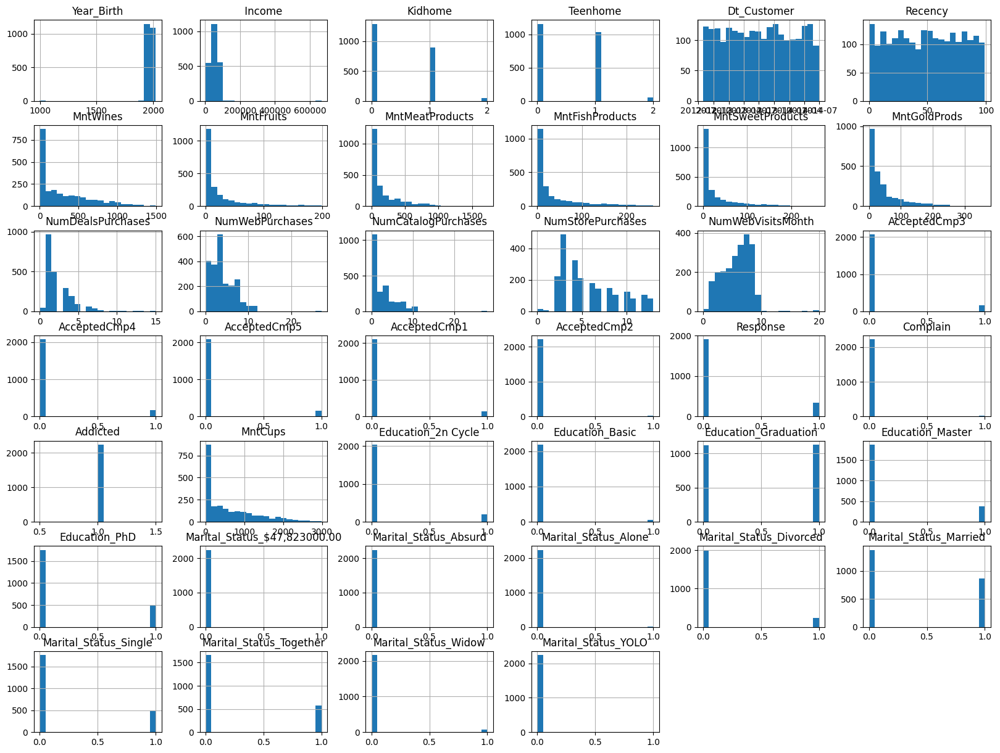

In [94]:
# Histogramas de todas las variables usando matplotlin incluidas las variables categoricas en one-hot

import matplotlib.pyplot as plt
print(df.shape)
# Convertir las columnas booleanas a binario (1 para True, 0 para False)
df = df.replace({True: 1, False: 0})
df.hist(bins=20, figsize=(20,15))
plt.show()









De estas grafícas podemos obtener mucha información sobre la distribución de los datos, por ejemplo, en la variable 'complain' se puede ver como aunque contiene los valores 0 y 1 practicamente todos los valores son 0, lo que indica que la mayoría de los clientes no han presentado ninguna queja. En la variable 'numwebvisitsmonth' se puede ver como la mayoría de los clientes visitan la web entre 0 y 5 veces al mes, lo que indica que la mayoría de los clientes no visitan la web muy a menudo. En la variable 'income' se puede ver como la mayoría de los clientes tienen un ingreso entre 0 y 100000, lo que indica que la mayoría de los clientes tienen un ingreso medio. 

Hay una gran cantidad de features con gran mayoria de valores en 0, lo que indica que la mayoría de los clientes no han realizado esa acción o son muy específicas, como por ejemplo 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Kidhome', 'Teenhome'. En los one-hot también es más común que haya más 0 que 1, lo que indica que la mayoría de los clientes no pertenecen a esa categoría.

Otra curiosidad es la feature 'addicted' que tiene todos sus valores en 1.


In [77]:
addicted_counts = df['Addicted'].value_counts()
addicted_counts

Addicted
1    2240
Name: count, dtype: int64

Esto puede deberse a un error en la recopilación, de no ser así es un dato curioso pero que no aportaría nada al modelo, ya que no aporta información sobre posibles patrones de comportamiento de los clientes.

Otra curiosidad es que muchas de las variables parecen seguir una distribución exponencial, y ninguna parece seguir una gaussiana aunque la más cercana sería 'response'. Para analizar en más profundidad se hara uso de Kernel Density Estimation (KDE) para visualizar la distribución de las variables sobre todo en el caso de las variables continuas.



C:\Users\alvar\AppData\Local\Temp\ipykernel_12900\3609242984.py:15: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(numeric_df[col], ax=axes[i], color=colors[i], label=col)


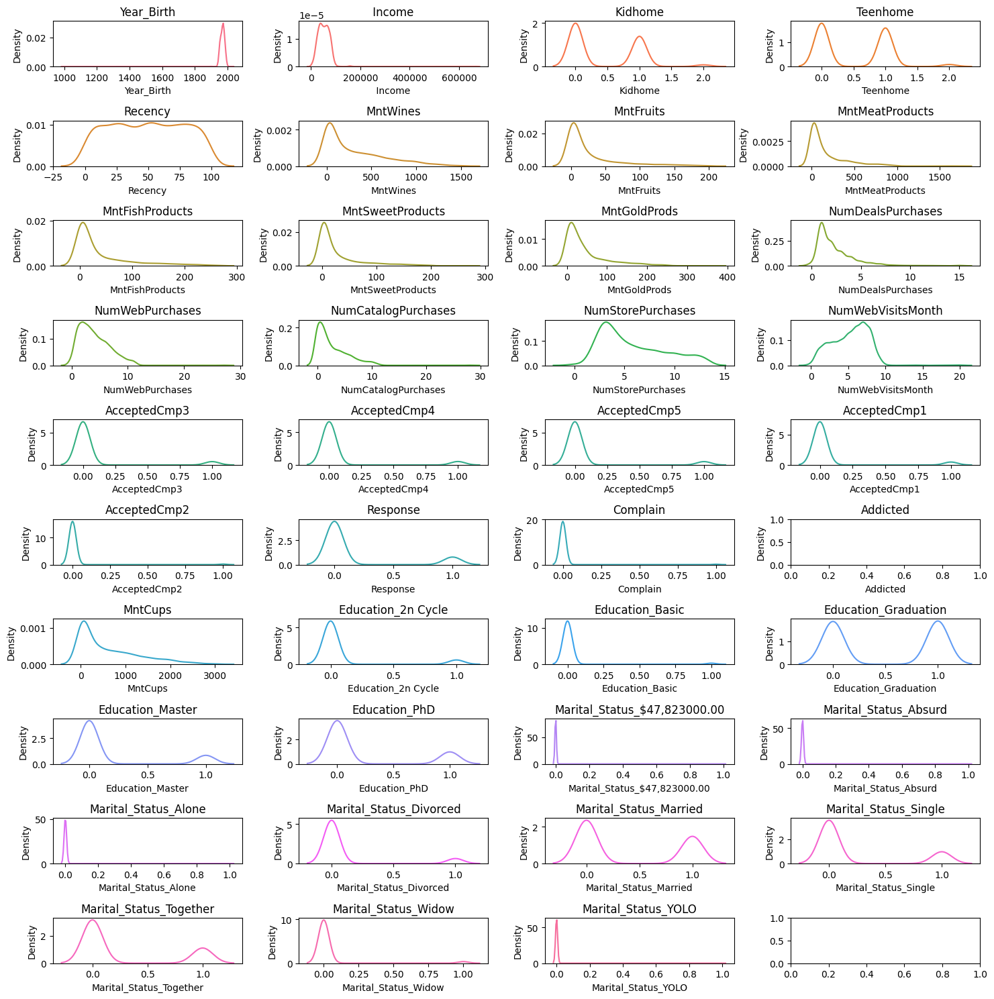

In [132]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una copia del DataFrame numérico para no modificar el original ya que me daban errores con el formato fecha sobre todo.
numeric_df = df.select_dtypes(include=['float64', 'int64']).copy()


fig, axes = plt.subplots(nrows=10, ncols=4, figsize=(15, 15)) 
axes = axes.flatten()

colors = sns.color_palette("husl", len(numeric_df.columns))

# Graficar la densidad de cada variable numérica
for i, col in enumerate(numeric_df.columns[::]):  
    sns.kdeplot(numeric_df[col], ax=axes[i], color=colors[i], label=col)
    axes[i].set_title(col)

# Ajustar el layout para evitar superposiciones
plt.tight_layout()
plt.show()


De estas gráficas podemos obtener información sobre la distribución de las variables, como hemos comentado anteriormente, varias features siguen una distribución bimodal pero esto es debido a que son clases binarias, como 'response', 'complain' y la gran mayoría. La feature Income parece seguir una distribución normal con muchos outliers lo que supondría que la gran mayoria de los clientes tienen salarios cercanos a la media salbo algunos outliers que ingresan mucho dinero.

Otra feature curiosa es Recency que tiene valores constantes en toda la gráfica, es decir es una distribución plana, esto puede sugerir que no hay un patron claro de compras frecuentes.

Muchas de las variables parecen seguir una distribución Chi-cuadrado, como 'NumWebVisitsMonth'o 'NumDealsPurchases' con un crecimiento muy rapido en el inicio y un decrecimiento bajo después, lo que indica que la mayoría de los clientes no realizan muchas compras en la web o no realizan muchas compras con descuento.

## Visualización mediante Boxplots
 

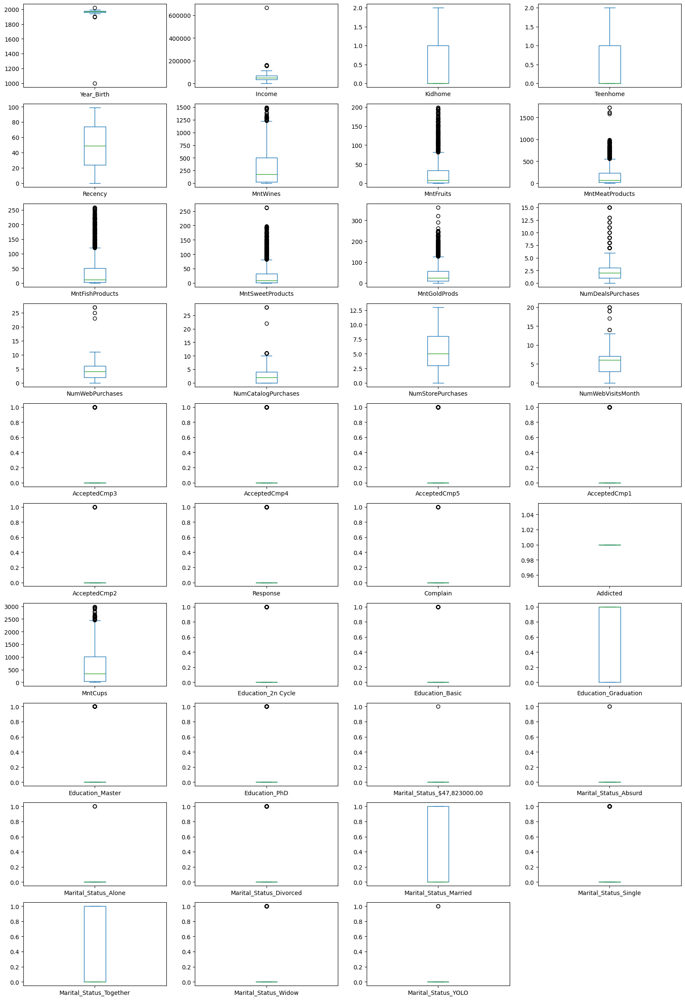

In [138]:
# Boxplots de todas las variables numéricas

df.plot(kind='box', subplots=True, layout=(10,4), sharex=False, sharey=False,figsize=(20,30))
plt.show()


De estos boxplots podemos obtener información sobre la distribución de los datos, por ejemplo, en la variable 'Recency' se puede ver como la mayoría de los clientes han realizado una compra recientemente, ya que la mediana está cerca del mínimo, no hay outliers, en resumen lo que comentamos previamente.

Como se vio anteriormente hay muchas clases que tienen casi todos los valores en 0 dando como resultado a una gran cantidad de outliers aun siendo valores relativamente pequeños, esto es visible para las clases: 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts' y 'MntGoldProducts'.




## Correlaciones entre variables

Las correlaciones entre variables pueden proporcionar información sobre relaciones en los datos. A continuación, se calcularán las correlaciones entre las variables numéricas para identificar posibles relaciones lineales entre los atributos.

In [155]:

# Correlaciones entre variables

#En este caso se podría realizar un one-hot encoding para las variables categóricas, pero no se realizará para la variable country, ya que de hacerlo la categoria añadiría demasiadas columnas, lo que dificultaría la visualización de las correlaciones.
df = pd.get_dummies(df, columns=['Education', 'Marital_Status'])
#eliminar country
df = df.drop(columns=['Country'])
correlations = df.corr()
print(correlations)

                              Year_Birth   Income    Kidhome  Teenhome  Dt_Customer   Recency  \
Year_Birth                      1.000000 -0.089252  0.131681 -0.159985    -0.029038  0.018998   
 Income                        -0.089252  1.000000 -0.428669  0.019133     0.018531 -0.003970   
Kidhome                         0.131681 -0.428669  1.000000 -0.036133     0.053343  0.008827   
Teenhome                       -0.159985  0.019133 -0.036133  1.000000    -0.017465  0.016198   
Dt_Customer                    -0.029038  0.018531  0.053343 -0.017465     1.000000 -0.024522   
Recency                         0.018998 -0.003970  0.008827  0.016198    -0.024522  1.000000   
MntWines                       -0.104921  0.578650 -0.496297  0.004846    -0.166264  0.016064   
MntFruits                      -0.033701  0.430842 -0.372581 -0.176764    -0.066928 -0.004306   
MntMeatProducts                -0.022735  0.584633 -0.437129 -0.261160    -0.092713  0.023056   
MntFishProducts               

Podemos observar que la variable objetivo 'Response' tiene clases desequilibradas, con una gran cantidad de instancias en la clase '0' y una cantidad mucho menor en la clase '1'. Esto puede requerir un tratamiento especial durante el entrenamiento del modelo, como el uso de técnicas de sobremuestreo o submuestreo para equilibrar las clases, estratificación en la validación cruzada, o el uso de métricas de evaluación específicas para problemas desequilibrados.

Con el fin de visualizarlo se procederá a realizar un mapa de calor de las correlaciones.

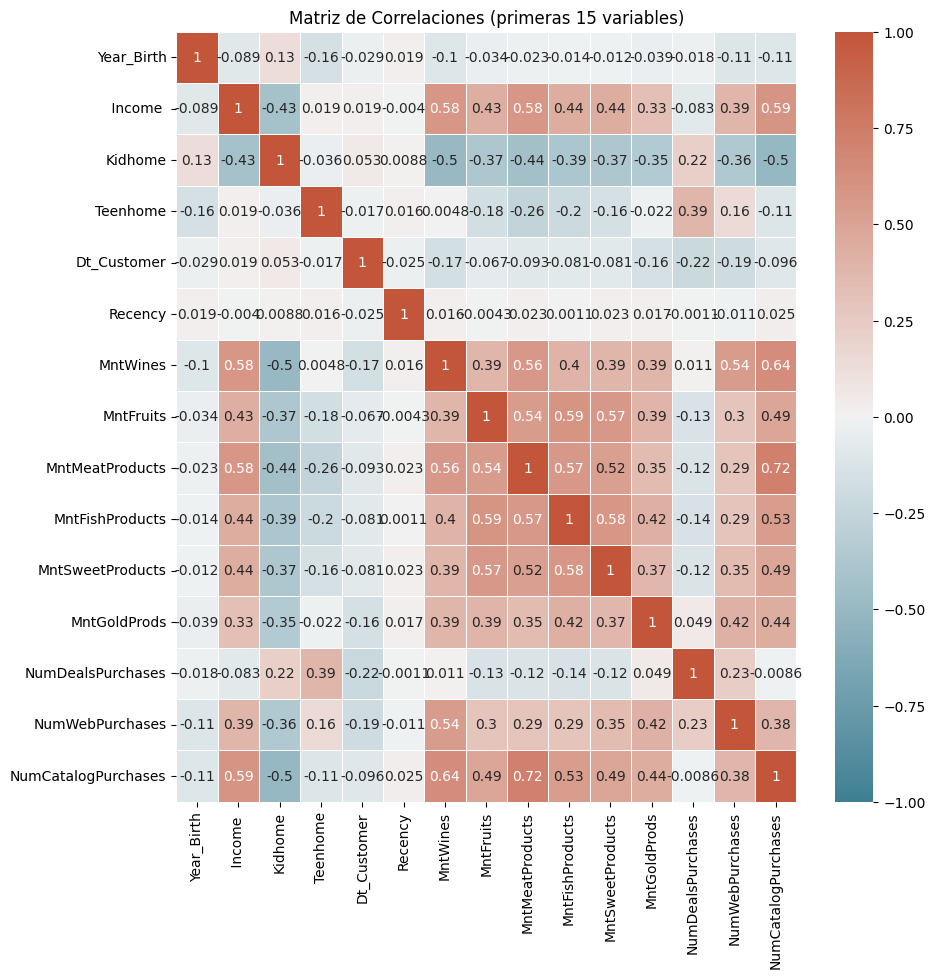

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt 
#Se visualizarán la correlacion de 15 features para una mejor visualización, ya que hay muchas features.
plt.figure(figsize=(10,10))
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Visualizar la matriz de correlaciones (las primeras 15 features)
sns.heatmap(correlations.iloc[:15, :15], annot=True, cmap=cmap, center=0, linewidths=0.5, vmin=-1, vmax=1)

# Mostrar el gráfico
plt.title('Matriz de Correlaciones (primeras 15 variables)')
plt.show()


In [64]:

# Correlaciones más altas
correlations_mas_altas = correlations.unstack().sort_values(ascending=False).drop_duplicates()
print(correlations_mas_altas[correlations != 1].head(10))
print(correlations_mas_altas[correlations != 1].tail(10))

NumCatalogPurchases  MntMeatProducts        0.723827
MntWines             NumStorePurchases      0.642100
                     NumCatalogPurchases    0.635226
MntCups              NumCatalogPurchases    0.635226
MntFruits            MntFishProducts        0.594804
NumCatalogPurchases   Income                0.589162
MntMeatProducts       Income                0.584633
MntFishProducts      MntSweetProducts       0.579870
 Income              MntWines               0.578650
MntFishProducts      MntMeatProducts        0.568402
dtype: float64
Education_Master        Education_Graduation      -0.447205
Marital_Status_Married  Marital_Status_Together   -0.468390
MntCups                 Kidhome                   -0.496297
NumStorePurchases       Kidhome                   -0.499683
NumCatalogPurchases     Kidhome                   -0.502237
NumWebVisitsMonth       NumCatalogPurchases       -0.520364
Education_Graduation    Education_PhD             -0.529212
MntMeatProducts         NumWebVisit

Podemos observar que hay algunas correlaciones interesantes en el dataset:

- **Positivas**:
  - `'NumCatalogPurchases'` y `'MntMeatProducts'` tienen una correlación de 0.72, lo que sugiere que los clientes que compran más por catálogo también tienden a gastar más en productos cárnicos.
  - `'MntWines'` y `'NumStorePurchases'` muestran una correlación de 0.64, indicando que aquellos que compran más vino también realizan más compras en la tienda física.
  - `'Income'` y `'NumCatalogPurchases'` tienen una correlación de 0.59, lo cual podría interpretarse como que los clientes con mayores ingresos tienden a hacer más compras por catálogo.

- **Negativas**:
  - `'NumStorePurchases'` y `'Kidhome'` tienen una correlación negativa de -0.50, sugiriendo que aquellos con más niños en casa tienden a realizar menos compras en tiendas físicas.
  - `'Income'` y `'NumWebVisitsMonth'` presentan una correlación de -0.55, lo que podría indicar que los clientes con mayores ingresos visitan menos el sitio web, posiblemente porque compran menos en línea.
  - `'Education_Graduation'` y `'Education_PhD'` tienen una correlación negativa de -0.53, lo cual es lógico, ya que estas dos categorías son mutuamente excluyentes.

En resumen, estas correlaciones pueden **ofrecer información valiosa sobre las relaciones entre las variables**, ayudando a identificar patrones de comportamiento y características relevantes para el análisis. Sin embargo, en modelos de regresión lineal, estas correlaciones altas podrían ser perjudiciales debido a la **multicolinealidad**, lo que complica la interpretación de los coeficientes y puede influir en la precisión del modelo.


## Pairplots

Para visualizar las relaciones entre las variables, se procederá a realizar pairplots de las variables numéricas. Los pairplots son una forma eficaz de visualizar las relaciones entre múltiples variables en un solo gráfico, lo que permite identificar patrones y tendencias en los datos.

In [174]:
#  Pairplots de las variables numéricas 
sns.pairplot(df[numeric_df.columns[::]])
plt.show()


Son demasiados pairplots por lo que se analizarán las primers 7 variables, para obtener una mejor visualización.

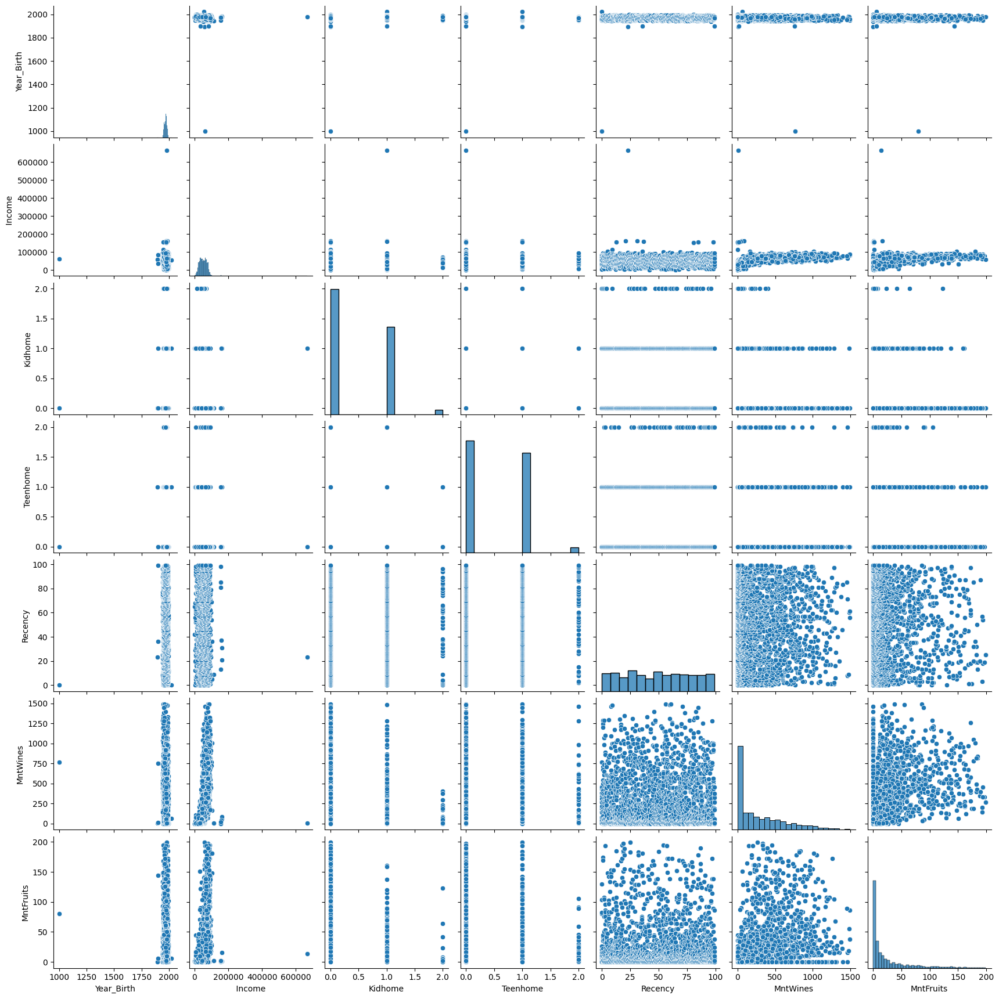

In [176]:
# Pairplots de las primeras 10 variables numéricas
sns.pairplot(df[numeric_df.columns[:7]])
plt.show()

En el gráfico de pairplot que se presenta, podemos observar la distribución y las correlaciones entre diferentes variables del dataset.

Distribuciones de las variables individuales: A lo largo de la diagonal del pairplot, se pueden ver histogramas que muestran la distribución de cada variable. Por ejemplo, "Income" tiene una distribución asimétrica con concentración hacia valores bajos, mientras que "Year_Birth" se centra en ciertos años específicos.

Correlaciones positivas y negativas: Se observan relaciones positivas claras entre "MntWines" y "MntFruits", así como entre "MntWines" y "MntMeatProducts", lo cual sugiere patrones de consumo relacionados. Estas correlaciones coinciden con las previamente mencionadas, como entre 'NumCatalogPurchases' y 'MntMeatProducts' (0.72), y 'MntWines' y 'NumStorePurchases' (0.64). También hay correlaciones negativas, como entre 'NumStorePurchases' y 'Kidhome' (-0.50), lo cual indica que los clientes con más niños tienden a hacer menos compras en tiendas físicas.

Ausencia de correlación: Varias combinaciones de variables no muestran una relación lineal clara, como "Income" y "Year_Birth", lo cual sugiere una falta de correlación significativa entre estas variables.

Relaciones categóricas: Variables como "Kidhome" y "Teenhome" se agrupan en pocas categorías, sugiriendo un análisis más adecuado como variables categóricas.

En resumen, las correlaciones observadas ayudan a identificar patrones de comportamiento y a segmentar clientes. No obstante, las altas correlaciones pueden causar problemas de multicolinealidad en modelos de regresión, complicando la interpretación y afectando la precisión del modelo.

## Visualización mediante PCA

Se procederá a realizar un análisis de componentes principales (PCA) para visualizar la distribución de los datos en un espacio de menor dimensión. El PCA es una técnica de reducción de la dimensionalidad que permite representar los datos en un espacio de menor dimensión, manteniendo la mayor cantidad de información posible. A continuación, se aplicará PCA a los datos numéricos y se visualizará la distribución de los datos en un espacio bidimensional.

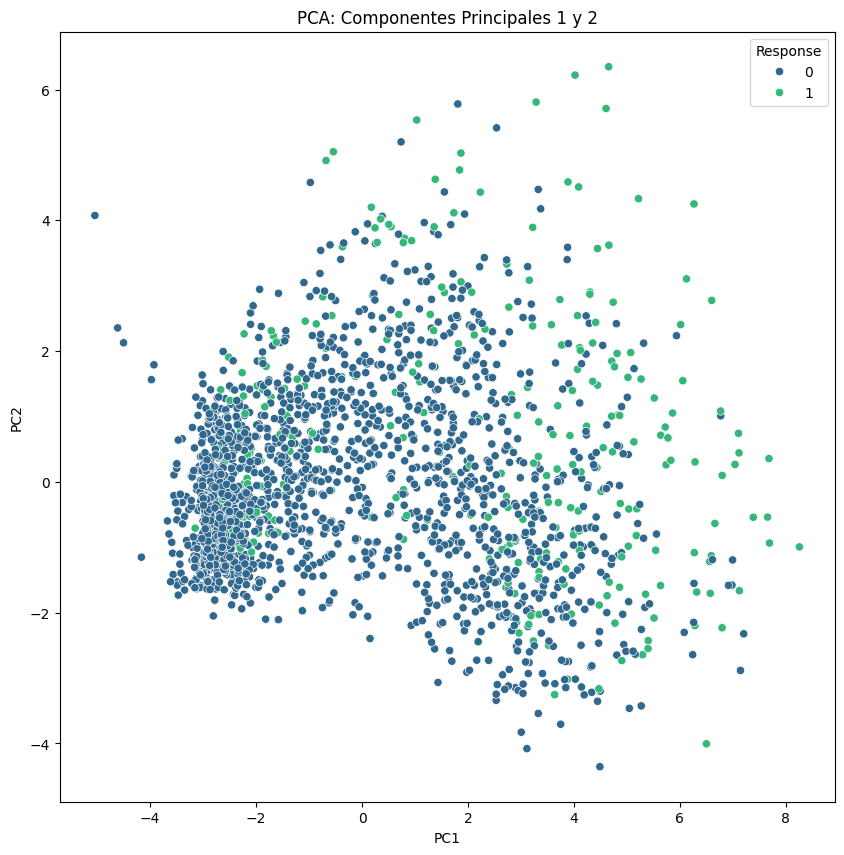

In [158]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

# Eliminar filas con NaNs en las variables numéricas y la variable 'Response'
df_clean = df.dropna(subset=['Response'] + numeric_df.columns.tolist())

# Escalar las variables numéricas
scaler = StandardScaler()
numeric_df_scaled = scaler.fit_transform(df_clean[numeric_df.columns])

# Aplicar PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(numeric_df_scaled)

# Crear un DataFrame con los componentes principales
pca_df = pd.DataFrame(data = principal_components, columns = ['PC1', 'PC2'])

# Añadir la variable 'Response' directamente desde el DataFrame original limpio
pca_df['Response'] = df_clean['Response'].values

# Visualizar los datos en 2D
plt.figure(figsize=(10, 10))
sns.scatterplot(x='PC1', y='PC2', hue='Response', data=pca_df, palette='viridis')
plt.title('PCA: Componentes Principales 1 y 2')
plt.show()


En 3 dimensiones

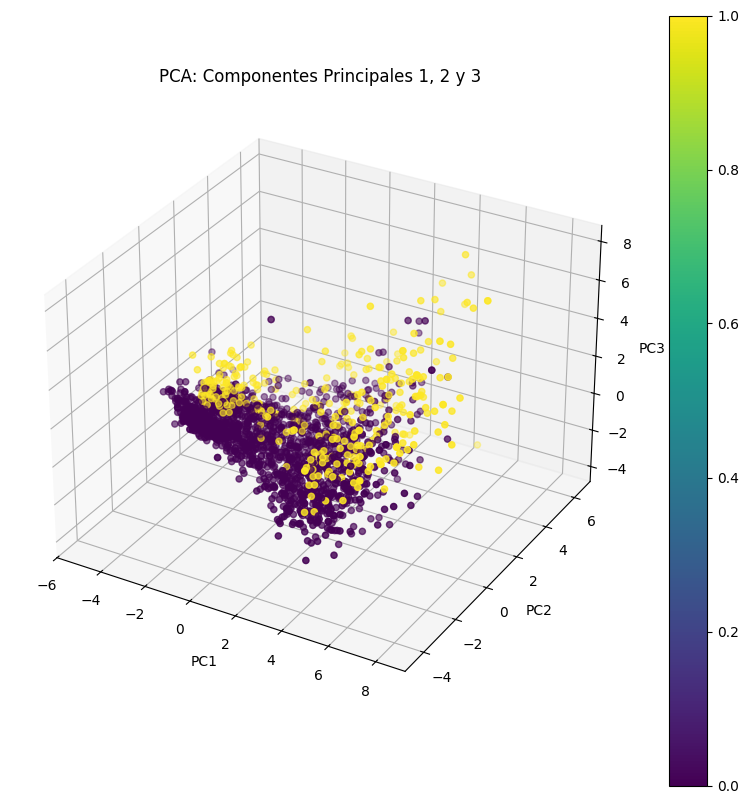

In [159]:
# Eliminar filas con NaNs en las variables numéricas y la variable 'Response'
df_clean = df.dropna(subset=['Response'] + numeric_df.columns.tolist())

# Escalar las variables numéricas
scaler = StandardScaler()
numeric_df_scaled = scaler.fit_transform(df_clean[numeric_df.columns])

# Aplicar PCA con 3 componentes
pca = PCA(n_components=3)
principal_components = pca.fit_transform(numeric_df_scaled)

# Crear un DataFrame con los 3 componentes principales
pca_df = pd.DataFrame(data = principal_components, columns = ['PC1', 'PC2', 'PC3'])

# Añadir la variable 'Response' directamente desde el DataFrame original limpio
pca_df['Response'] = df_clean['Response'].values

# Visualizar los datos en 3D
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Colores de los puntos según la variable 'Response'
scatter = ax.scatter(pca_df['PC1'], pca_df['PC2'], pca_df['PC3'], c=pca_df['Response'], cmap='viridis')

# Añadir etiquetas a los ejes
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Título del gráfico
ax.set_title('PCA: Componentes Principales 1, 2 y 3')

# Añadir barra de color para la variable 'Response'
fig.colorbar(scatter)

plt.show()

En estas gráficas podemos ver como se distribuyen los datos reduciendo las dimensiones de 40 a 2 y 3; sin embargo, no se puede distinguir claramente las clases, por lo que no se puede sacar ninguna conclusión clara de estas gráficas. Es posible que se necesite un mayor número de componentes principales para capturar la variabilidad de los datos de manera más efectiva.

## Modelo preliminar

Se creará un modelo preliminar para evaluar la dificultad del problema y establecer una referencia inicial sobre el rendimiento esperado. En este caso, se utilizará un modelo de regresión logística para predecir la variable objetivo 'Response' a partir de las demás variables. A continuación, se dividirán los datos en conjuntos de entrenamiento y prueba, se ajustará el modelo y se evaluará su rendimiento mediante métricas de evaluación.

In [172]:
from sklearn.model_selection import train_test_split

# Dividir los datos en variables predictoras y variable objetivo

df_clean = df.dropna().copy()

# Convertir columnas de tipo fecha a características numéricas
for col in df_clean.select_dtypes(include=['datetime64']).columns:
    df_clean.loc[:, col + '_year'] = df_clean[col].dt.year
    df_clean.loc[:, col + '_month'] = df_clean[col].dt.month
    df_clean.loc[:, col + '_day'] = df_clean[col].dt.day
#Eliminar la fwecha    
df_clean = df_clean.drop(columns=df_clean.select_dtypes(include=['datetime64']).columns)

X = df_clean.drop(columns=['Response'])
y = df_clean['Response']

# One hot de las categoricas
X = pd.get_dummies(X, drop_first=True)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear un modelo de regresión logística
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

model = LogisticRegression(max_iter=1000)

# Ajustar el modelo a los datos de entrenamiento
model.fit(X_train, y_train)

# Predecir la variable objetivo en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el rendimiento del modelo
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Precisión del modelo:", accuracy)
print("\nInforme de clasificación:\n", report)


Precisión del modelo: 0.8468468468468469

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.87      0.97      0.92       379
           1       0.43      0.14      0.21        65

    accuracy                           0.85       444
   macro avg       0.65      0.55      0.56       444
weighted avg       0.80      0.85      0.81       444



C:\Users\alvar\PycharmProjects\AnalisisDeDatos\.venv\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


El modelo preliminar de regresión logística obtiene una precisión del 0.88, lo que indica que el modelo es capaz de predecir correctamente el 88% de las instancias en el conjunto de prueba. El informe de clasificación muestra métricas adicionales como la precisión, la recuperación y la puntuación F1 para cada clase, lo que proporciona una visión más detallada del rendimiento del modelo, aunque el accuracy nos da un valor alto si nos fijamos en el informe de clasificación podemos ver que la clase 1 tiene un recall muy bajo, lo que indica que el modelo no es capaz de predecir correctamente la clase 1, por lo que se podría considerar que el modelo no es tan bueno como parece. Aun así, sin haber hecho un preproceso muy desarrollado, el modelo ha obtenido un resultado aceptable por lo que con más datos o un preproceso más elaborado se podría obtener un buen modelo.